# Install packages, import libraries, define functions

Install packages

In [1]:
%%capture
!pip install Pillow
!pip install opencv-python
!pip install rembg
!pip install easygui
!pip install numpy==1.23

Import libraries 

In [286]:
%%capture
from PIL import Image
import cv2
import os
import numpy as np
from rembg import remove
import easygui
import rembg
from matplotlib import pyplot as plt
from matplotlib import gridspec
from IPython.display import display, HTML

Defines functions

In [287]:
# The find_largest_contour function is used to define the edge of the object of interest. 
# It finds the largest of the contours from a list of all contours in the image. This is often 
# used to identify and isolate the primary object of interest in an image when multiple contours are present.
def find_largest_contour(contours):
    max_area = 0
    largest_contour = None
    for contour in contours:
        area = cv2.contourArea(contour)  # Calculating the area of the current contour
        if area > max_area:  # If this contour is larger than the current max_area
            max_area = area  # Replace max_area with the current contour's area
            largest_contour = contour  # The largest contour is now the current contour
    return largest_contour  # Return the largest contour found


# The rotate_image function is used to rotate a cropped image to align with either the x or y axis. 
# This is useful for standardizing the orientation of images or isolating particular angles of view.
def rotate_image(cropped_image, angle):
    (h, w) = cropped_image.shape[:2]  # The shape of the image (height, width)
    center = (w // 2, h // 2)  # The center of the image

    # Calculate new image width and height to prevent clipping after rotation
    d = np.sqrt(h**2 + w**2)
    new_h, new_w = int(d), int(d)  # The new height and width are the diagonal of the original image

    M = cv2.getRotationMatrix2D(center, angle, 1.0)  # The rotation matrix, with the center, angle, and scale (1.0 means same scale)
    
    # Adjust the rotation matrix to take into account translation
    M[0, 2] += (new_w / 2) - center[0]  # Shifting the x-values to the right, so the image is not cut off on the right
    M[1, 2] += (new_h / 2) - center[1]  # Shifting the y-values down, so the image is not cut off at the bottom

    # The image is then rotated using the cv2.warpAffine() function with the rotation matrix M, 
    # the new width and height, and some additional parameters. 
    # The flag cv2.INTER_CUBIC is used for the interpolation method, 
    # and the borderMode cv2.BORDER_REPLICATE is used to handle how the border is filled.
    return cv2.warpAffine(cropped_image, M, (new_w, new_h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

# Imports, crops, and transforms image prior to analysis

Imports images with easygui function

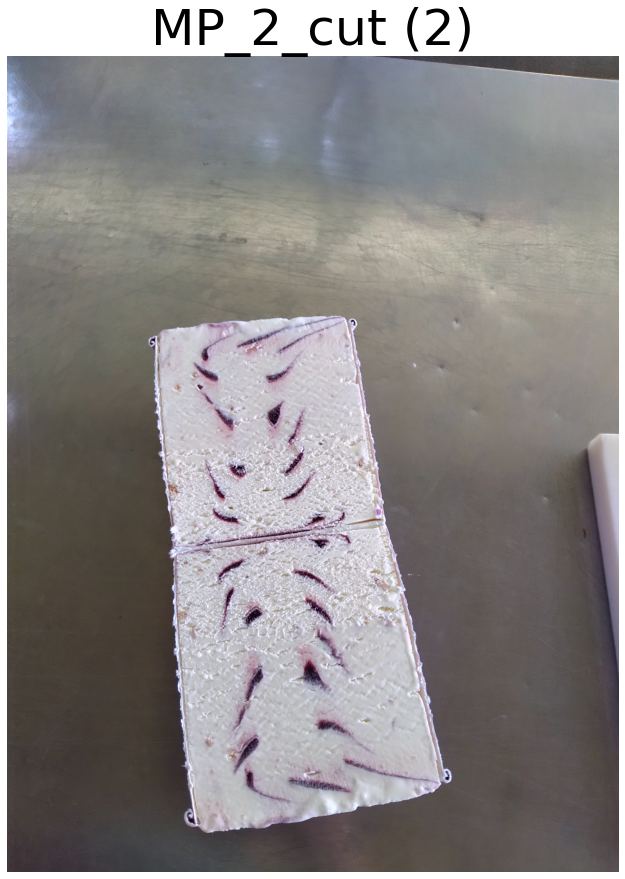

In [355]:
# Set the default directory for all file dialog boxes in the program
# This directory path should be changed according to the user's directory structure
default_dir = r"C:\Users\kuhfeldr\OneDrive - Oregon State University\Documents\Ice Cream\Ice Cream Cuts Analysis\low res 2023\\"

# Open a file dialog box with the default directory set
# The file dialog box allows the user to choose the image file to be processed
file_path = easygui.fileopenbox(default=default_dir)

# Save the chosen image into an array, and also into a separate array that will be modified later
# The Image.open() function is used to open the image file
# The cv2.imread() function is used to read the image file into a numpy array
image = Image.open(file_path)
imported_image = cv2.imread(file_path)
imported_image = cv2.cvtColor(imported_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB to match matlab reporting

# Extract the filename from the file path
# The os.path.basename() function is used to get the last part of the path, which is the filename
filename_with_ext = os.path.basename(file_path)

# Split the filename and the extension
# The os.path.splitext() function is used to split the filename into the name and the' extension
filename, file_extension = os.path.splitext(filename_with_ext)

# Show the image
fig, ax = plt.subplots(figsize=(15, 15))
plt.imshow(imported_image)
plt.title(f"{filename}")
plt.axis("off")
plt.show()

Removes background and returns the cropped image with remove function from rembg

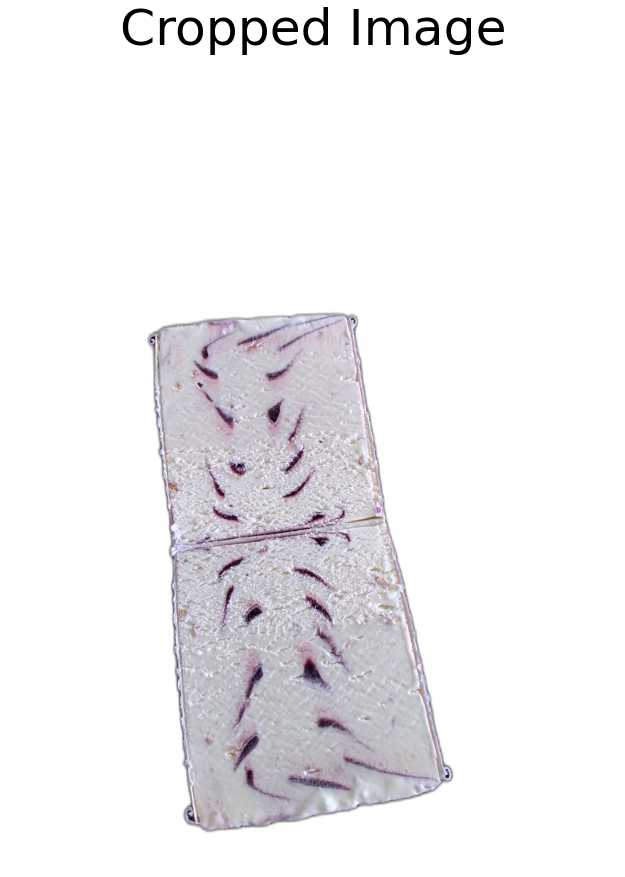

In [356]:
# Remove the background using rembg
# 'image' is the input image that you want to remove the background from
# rembg.remove() is used to remove the background using the rembg library
image_crop = rembg.remove(image)

# Convert the resulting image to a NumPy array with data type uint8
# 'cropped_image_array' will store the background-removed image as a NumPy array
cropped_image_array = np.array(image_crop, dtype=np.uint8)


# Display the contours
fig, ax = plt.subplots(figsize=(15, 15))
plt.title(f"Cropped Image")
plt.imshow(cropped_image_array)
plt.axis("off")
plt.show()

#Rotates image and return the orginal image with the fitLine drawn and the rotated image plus new dimensions

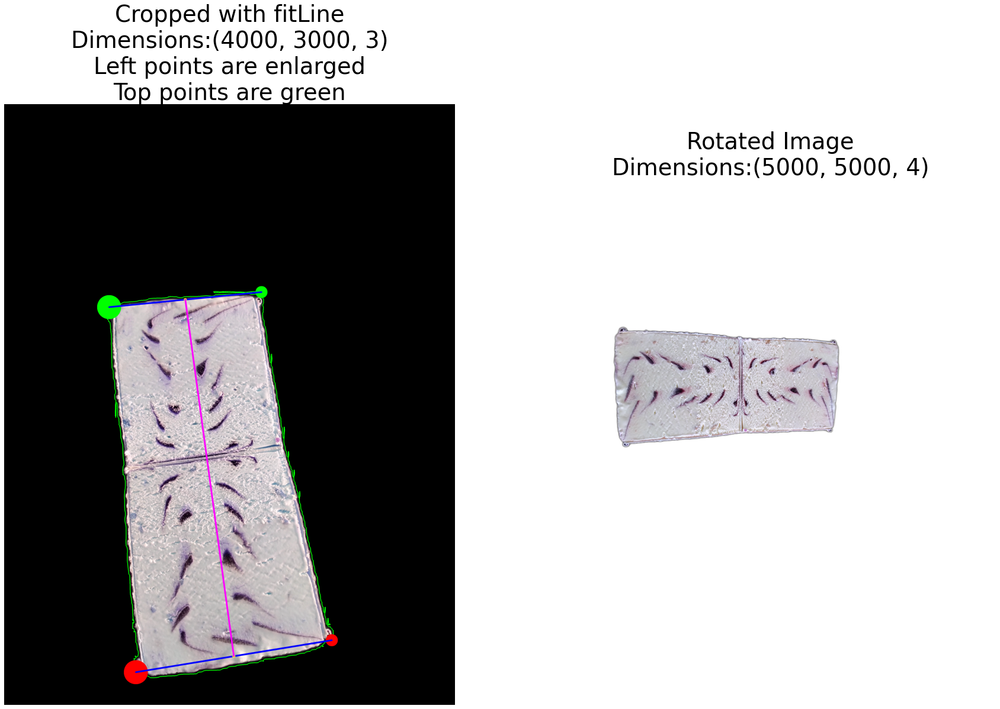

In [367]:
im=cropped_image_array.copy()

# Find contours in the thresholded image
# Convert the cropped image array to grayscale
grayscale_image = cv2.cvtColor(cropped_image_array, cv2.COLOR_BGR2GRAY)

# Find contours in the grayscale image using cv2.findContours()
# cv2.RETR_EXTERNAL retrieves only the external contours
# cv2.CHAIN_APPROX_SIMPLE approximates the contours to save memory
contours, _ = cv2.findContours(grayscale_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour using the find_largest_contour() function
largest_contour = find_largest_contour(contours)
cv2.drawContours(im, [largest_contour], -1, (0, 255, 0), 3)  # Blue color for contours

# Convert to 3-channel if it is 4-channel
im = cv2.cvtColor(im, cv2.COLOR_RGBA2BGR)

# Convert contour to a numpy array and reshape it
contour_array = np.array(largest_contour).reshape(-1, 2)

# Find the corners
top_left = tuple(contour_array[np.argmin(contour_array[:, 0] + contour_array[:, 1])])
bottom_left = tuple(contour_array[np.argmin(contour_array[:, 0] - contour_array[:, 1])])
top_right = tuple(contour_array[np.argmax(contour_array[:, 0] - contour_array[:, 1])])
bottom_right = tuple(contour_array[np.argmax(contour_array[:, 0] + contour_array[:, 1])])

# Calculate lengths of the lines
length_top_line = ((top_right[0] - top_left[0])**2 + (top_right[1] - top_left[1])**2)**0.5
length_mid_line = ((midpoint2[0] - midpoint1[0])**2 + (midpoint2[1] - midpoint1[1])**2)**0.5

# Draw these points on the image
cv2.circle(im, top_left, 80, (0, 255, 0), -1)
cv2.circle(im, bottom_left, 80, (255, 0, 0), -1)
cv2.circle(im, top_right, 40, (0, 255, 0), -1)
cv2.circle(im, bottom_right, 40, (255, 0, 0), -1)

# Draw lines
cv2.line(im, top_left, top_right, (0, 0, 255), 10)
cv2.line(im, bottom_left, bottom_right, (0, 0, 255), 10)
    
# Calculate and draw midpoints
midpoint1 = ((top_left[0] + top_right[0]) // 2, (top_left[1] + top_right[1]) // 2)
midpoint2 = ((bottom_left[0] + bottom_right[0]) // 2, (bottom_left[1] + bottom_right[1]) // 2)
cv2.circle(im, midpoint1, 10, (255, 255, 0), -1)  # Yellow dot for midpoint
cv2.circle(im, midpoint2, 10, (255, 255, 0), -1)  # Yellow dot for midpoint
# Draw a line connecting these middle points
cv2.line(im, midpoint1, midpoint2, (255, 0, 255), 10)  # Magenta line connecting midpoints

# Calculate the angle of this line with respect to the horizontal axis
delta_x = midpoint2[0] - midpoint1[0]
delta_y = midpoint2[1] - midpoint1[1]
raw_angle = np.arctan2(delta_y, delta_x) * 180. / np.pi

# Adjust the angles to be between -90 and +90 degrees
if raw_angle > 90:
    angle = raw_angle - 180
else:
    angle = raw_angle + 180
if raw_angle > 90 and length_top_line > length_mid_line:
    angle = raw_angle - 90
elif length_top_line > length_mid_line:
    angle = raw_angle + 90

# Convert the angle to a float (should already be a float, but just to be sure)
angle = float(angle)

# Negate the angle to rotate in the correct direction
angle = -angle

# Rotate the cropped image using the rotate_image() function
rotated_image = rotate_image(cropped_image_array, -angle)

# Display the rotated image and the cropped image with the fitted line
fig = plt.figure(figsize=(30, 30))
gs = gridspec.GridSpec(1, 2, hspace=10**-1)
plt.rcParams['font.size'] = 32

ax1 = plt.subplot(gs[0])
ax1.imshow(im)
ax1.title.set_text(f"Cropped with fitLine\nDimensions:{im.shape}\nLeft points are enlarged\nTop points are green")
ax1.axis("off")

ax2 = plt.subplot(gs[1])
ax2.imshow(rotated_image)
ax2.title.set_text(f"Rotated Image\nDimensions:{rotated_image.shape}")
ax2.axis("off")
plt.show()

Transforms images to grey and threshold coloring, then removes excess background from roating the image

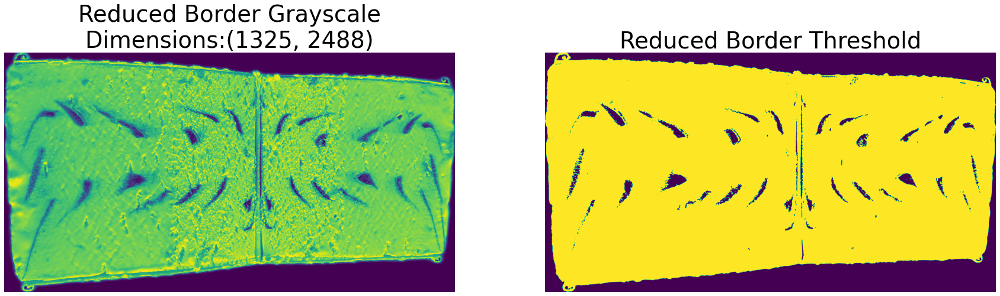

In [368]:
# Convert the image to grayscale
reduced_border_gray_image = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to create a binary image
# 'ret' stores the threshold value (not used in this code)
# 'reduced_border_thresh' contains the thresholded binary image
ret, reduced_border_thresh = cv2.threshold(reduced_border_gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Find contours in the thresholded image using cv2.findContours()
# 'contours' stores the detected contours
# '_' is used to ignore the hierarchy (not used in this code)
contours, _ = cv2.findContours(reduced_border_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour using the 'find_largest_contour()' function
largest_contour = find_largest_contour(contours)

# Get the bounding rectangle of the largest contour using cv2.boundingRect()
# 'x', 'y' represent the top-left corner coordinates of the bounding rectangle
# 'w', 'h' represent the width and height of the bounding rectangle
x, y, w, h = cv2.boundingRect(largest_contour)

# Extract the region of interest (ROI) from the rotated image
# 'reduced_border_gray_image', 'rotated_image', and 'reduced_border_thresh' will contain the cropped images
reduced_border_gray_image = reduced_border_gray_image[y:y+h, x:x+w]
reduced_border_thresh = reduced_border_thresh[y:y+h, x:x+w]
rotated_image = rotated_image[y:y+h, x:x+w]

#'reduced_border_rgb' is 3 dimensional array version of the 'educed_border_thresh' image
reduced_border_rgb = cv2.merge((reduced_border_thresh, reduced_border_thresh, reduced_border_thresh))

# Show the resulting images
fig = plt.figure(figsize=(30, 30))
gs = gridspec.GridSpec(1, 2, hspace=10**-1)
plt.rcParams['font.size'] = 32 

ax1 = plt.subplot(gs[0]) 
ax1.imshow(reduced_border_gray_image)
ax1.title.set_text(f"Reduced Border Grayscale\nDimensions:{reduced_border_gray_image.shape}")
ax1.axis("off")

ax2 = plt.subplot(gs[1])
ax2.imshow(reduced_border_thresh)
ax2.title.set_text(f"Reduced Border Threshold")
ax2.axis("off")
plt.show()

# Quantifies varigate percentage and ellipse aspect ratio

Calculates precentage of black pixels representing the variagate, returns % variagate and compiled images

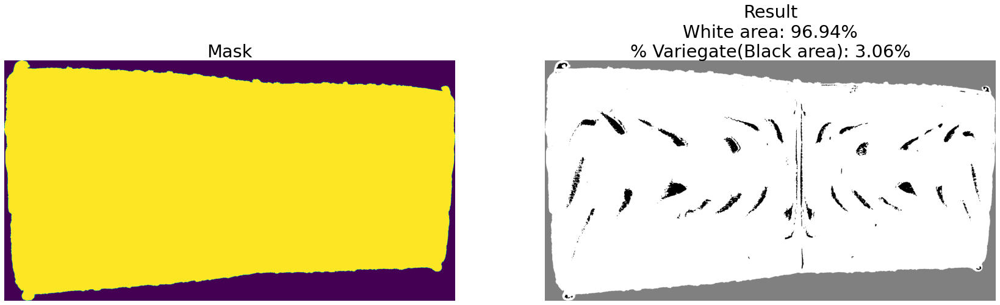

In [369]:
# Find contours in the binary image
# The findContours function is used to detect the contours in a binary image.
# The second and third arguments are contour retrieval mode and contour approximation method respectively.
reduced_border_contours, _ = cv2.findContours(reduced_border_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the largest contour
# We use a custom function to find the largest contour among the detected contours.
largest_contour = find_largest_contour(reduced_border_contours)

# Create a mask using the largest contour
# Initialize a zero matrix with the same shape as our grayscale image.
mask = np.zeros_like(reduced_border_gray_image)
# Draw the largest contour on this mask, with color white (255) and thickness -1 (indicating to fill the contour).
cv2.drawContours(mask, [largest_contour], 0, 255, -1)

# Convert the mask to uint8 type
# This is to ensure compatibility with other OpenCV functions.
mask = mask.astype(np.uint8)

# Create a new image with the desired background color
# This image will have the same size as the original and the color is set to gray (128,128,128).
background_color = (128, 128, 128)
output_image = cv2.bitwise_and(reduced_border_rgb, reduced_border_rgb, mask=mask)
new_image = np.full_like(output_image, background_color)

# Invert the mask to copy the region outside the largest contour
# This is used to isolate the background from the foreground (the largest contour).
inverted_mask_org = cv2.bitwise_not(mask)

# Copy the region outside the largest contour from the new image to the original image
# This replaces the background of the original image with the desired background color.
image_with_new_background = cv2.bitwise_and(new_image, new_image, mask=inverted_mask_org)

# Copy the region inside the largest contour from the original image to the new image
# This ensures the original foreground is kept in the final image.
result = cv2.bitwise_or(image_with_new_background, reduced_border_rgb)

# Count the number of white and black pixels in the thresholded image
# These counts are used to compute the areas of white and black regions in the next steps.
num_white_pixels = np.count_nonzero(result == 255)
num_black_pixels = np.count_nonzero(result == 0)
total_non_red_pixels = num_white_pixels + num_black_pixels

# Compute the area of black and white regions in pixels
# We calculate these areas as fractions of the total non-red pixel count.
area_white_pixels = num_white_pixels / total_non_red_pixels
area_black_pixels = num_black_pixels / total_non_red_pixels

# Set font size for matplotlib
plt.rcParams['font.size'] = 24

# Create a figure of specified size (45x45)
plt.figure(figsize=(45, 45))

# Subplot for the mask
plt.subplot(334)
plt.imshow(mask)
plt.title("Mask")
plt.axis("off")

# Subplot for the final result
plt.subplot(335)
plt.imshow(result)
plt.title(f"Result\nWhite area: {area_white_pixels*100:.2f}%\n% Variegate(Black area): {area_black_pixels*100:.2f}%")
plt.axis("off")

# Display the subplots
plt.show()

Displays the results of the variegate quantification

In [370]:
display(HTML(f"The percent variagate for ice cream cutting {filename} is <span style='font-size:1.5em; font-weight:bold;'>{area_black_pixels*100:0.2f}</span>"))

Removes the edge of the cropped image and enlarges the black pixels to fill in voids inside variegate

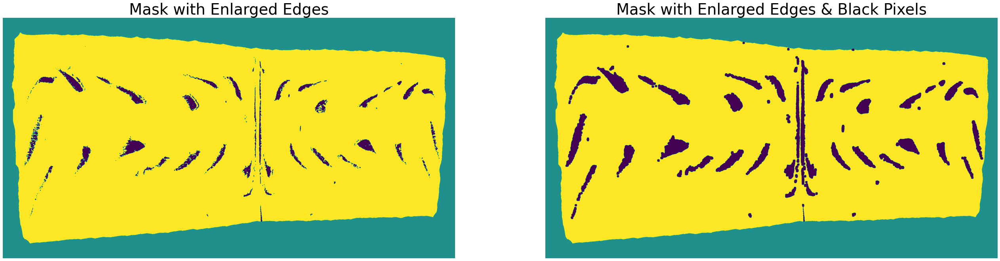

In [371]:
# Compute the distance transform of the mask. The cv2.distanceTransform function computes the distance 
# to the closest zero pixel for each pixel oelif raw_angle > 90:
dist_transform = cv2.distanceTransform(mask, cv2.DIST_L2, 5)

# Threshold the distance transform. Any value in dist_transform greater than 50 becomes 255, all other values become 0.
# This is used to isolate certain regions of the image
_, enlarged_mask = cv2.threshold(dist_transform, 50, 255, cv2.THRESH_BINARY)

# Convert back to original mask type
enlarged_mask = enlarged_mask.astype(mask.dtype)

# Use the enlarged mask to isolate parts of the reduced_border_thresh image.
# Only the pixels where the mask is white are retained.
output_image = cv2.bitwise_and(reduced_border_thresh, reduced_border_thresh, mask=enlarged_mask)

# Create a grey image of the same size as original image
grey_image = np.full_like(reduced_border_thresh, 128)

# Invert the mask to get the regions not covered by the original mask
inverted_mask = cv2.bitwise_not(enlarged_mask)

# Apply the inverted mask on the grey image, this will isolate the parts of the grey image where the mask is not present.
grey_image = cv2.bitwise_and(grey_image, grey_image, mask=inverted_mask)

# Combine the original image and the grey image.
output_image2 = cv2.bitwise_or(output_image, grey_image)

draw_image = output_image2.copy()

# Compute the area of the image
image_area = draw_image.shape[0] * draw_image.shape[1]

# Find contours in the output_image. Contours are curves joining all the continuous points along the boundary.
contours, _ = cv2.findContours(output_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours and compute areas
for cnt in contours:
    # Compute the area of the contour
    area = cv2.contourArea(cnt)

    # Exclude the contour if its area is too large or the contour has zero area.
    if area <= image_area/3.33:
        # Draw the contour in black
        cv2.drawContours(draw_image, [cnt], 0, (0,0,0), 10)

# Create a 1 row, 2 column grid for plotting
fig = plt.figure(figsize=(45, 45))
gs = gridspec.GridSpec(1, 2, hspace=10**-1)  
plt.rcParams['font.size'] = 32 

# Plot the enlarged mask
ax1 = plt.subplot(gs[0])  
ax1.imshow(output_image2)
ax1.title.set_text(f"Mask with Enlarged Edges")
ax1.axis("off")

# Plot the enlarged mask with contours drawn
ax2 = plt.subplot(gs[1])
ax2.imshow(draw_image)
ax2.title.set_text(f"Mask with Enlarged Edges & Black Pixels")
ax2.axis("off")

# Display the plots
plt.show()

Calculates radial dispersion factor (RDF) and returns image displaying bounding rectangles

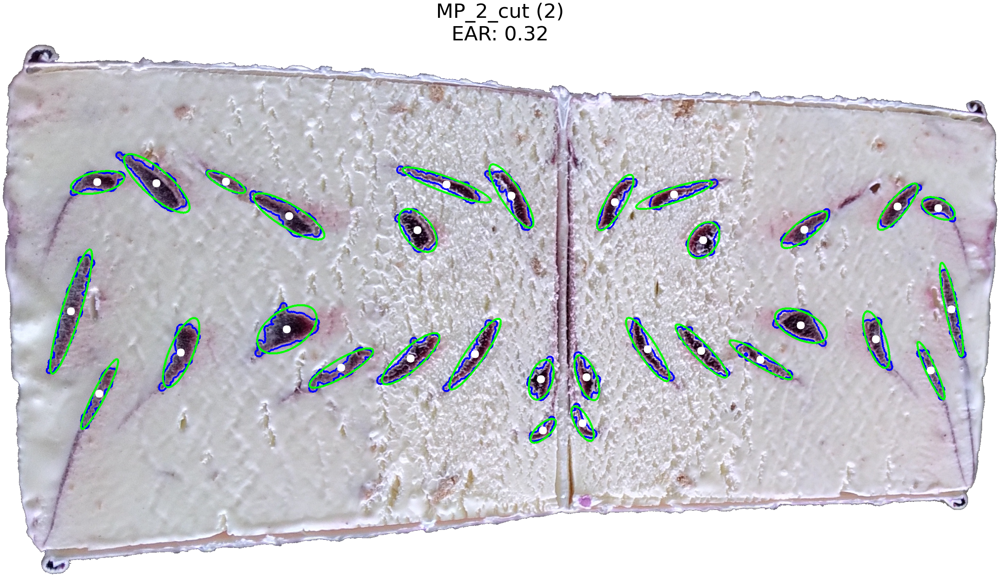

In [372]:
# Create copies of the images for visualization
vis_image = rotated_image.copy()

# Find the contours in the image
contours, _ = cv2.findContours(draw_image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

aspect_ratios = []
axis_ratios = []

# Define the size thresholds for bounding rectangle
min_width = 50
min_height = 50
max_width = result.shape[1]/2 
max_height = result.shape[0]/2

# Loop through each contour found
for contour in contours:
    # Get the moments of the current contour
    M = cv2.moments(contour)

    # Check for zero area contour, if found skip the current loop iteration
    if M["m00"] == 0:
        continue

    # Calculate the centroid of the contour
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])

    # Calculate the bounding rectangle for the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Check if the width and height of the bounding rectangle is within the defined threshold,
    # if not, skip the current loop iteration
    if w < min_width or h < min_height or w > max_width or h > max_height:
        continue

    # Draw each individual contour
    cv2.drawContours(vis_image, [contour], -1, (0, 0, 255), 3)  # Blue color for contours
    
    # Ratio of Major to Minor Axis of Fitted Ellipse
    if len(contour) >= 5:  # You need at least 5 points to fit an ellipse
        ellipse = cv2.fitEllipse(contour)
        (center, axes, orientation) = ellipse
        major_axis, minor_axis = axes
        axis_ratio = major_axis / minor_axis
               
        # Convert to tuple of integer, required for plotting
        center = tuple(map(int, center))  
        
        # Checks to ensrure center is drawn on black pixel reprsenting a swirl
        if  draw_image[center[1],center[0]] == 0:
            axis_ratios.append(axis_ratio)

            # Draw each ellipse/centroid
            cv2.circle(vis_image, center, 10, (255, 255, 255), -1)  # White color for Center
            cv2.ellipse(vis_image, ellipse, (0, 255, 0), 3)  # Green color for Ellipse
        else:
            # Draws and asjusted ellipse based on centroid from bounding rectangle using Red
            adjusted_ellipse = ((cX,cY), axes, orientation)
            major_axis, minor_axis = axes
            axis_ratio = major_axis / minor_axis
            axis_ratios.append(axis_ratio)

            cv2.ellipse(vis_image, adjusted_ellipse, (255,0,0), 3) # Red color for adjusted_llipse
            cv2.circle(vis_image, (cX,cY), 10, (0, 0, 0), -1)  # White color for Center

# Allows for colors to show correctly in the immage and turns background white
vis_image_rgb = cv2.cvtColor(vis_image, cv2.COLOR_BGR2RGB)
vis_image = cv2.cvtColor(vis_image_rgb, cv2.COLOR_RGB2BGRA)


# Set the alpha channel of vis_image to 255 where the mask is black
vis_image[inverted_mask_org == 255, 3] = 0

# If you want the background to be transparent, you're done
# If you want the background to be white:
#vis_image[binary_mask == 127, :3] = 255  # set RGB channels to white
#vis_image[binary_mask != 255, 3] = 255   # set alpha to fully opaque


# Create a figure of specified size
fig = plt.figure(figsize=(45, 45))
gs = gridspec.GridSpec(1, 1, hspace=10**-1)
plt.rcParams['font.size'] = 42

# Add the images to the subplot
ax1 = plt.subplot(gs[0])
ax1.imshow(vis_image)
ax1.title.set_text(f"{filename}\nEAR: {np.mean(axis_ratios):0.2f}")
ax1.axis("off")

# Display the plot
plt.show()

Displays the results of the radial dispersion factor

In [353]:
display(HTML(f"For ice cream cutting {filename} the mean ellipse aspect ratio of each 'blob' is <span style='font-size:1.5em; font-weight:bold;'>{np.mean(axis_ratios):0.2f}</span>"))

Displays a summary of four key images and the quantified values

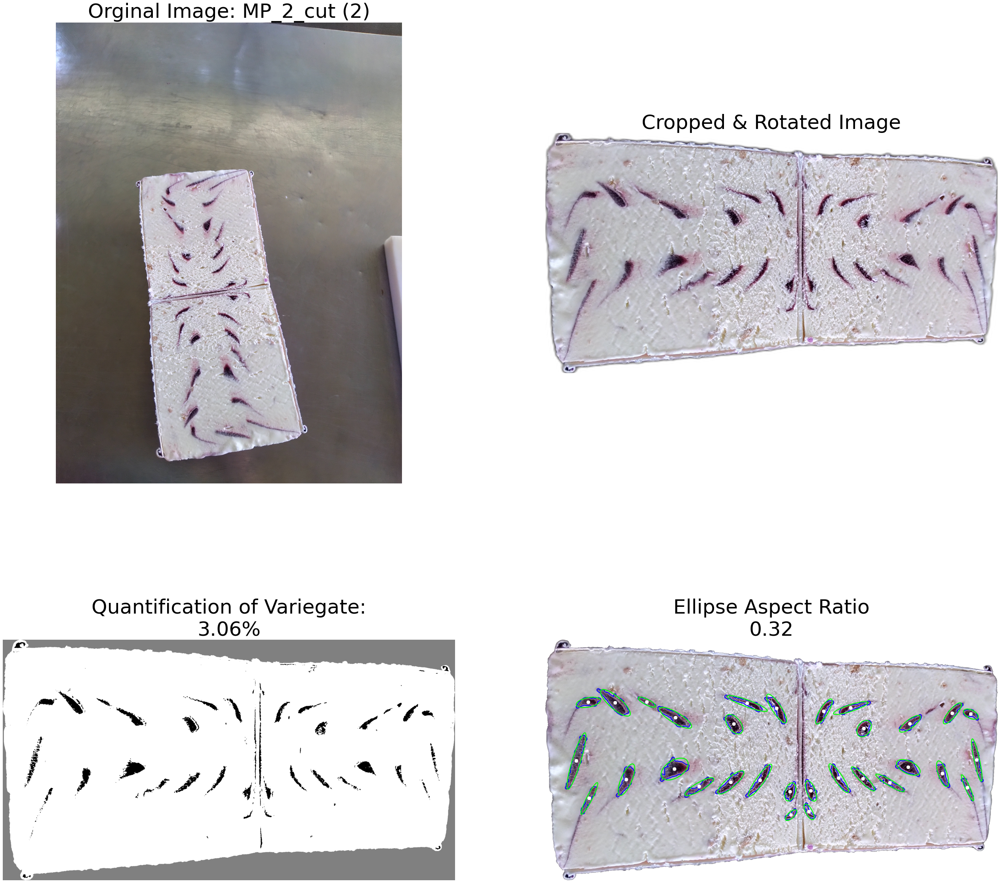

In [373]:
# Create a figure of specified size
fig = plt.figure(figsize=(45, 45))

# GridSpec divides the figure into a grid with 2 rows and 2 columns. 
# height_ratios is used to adjust the height of each row and hspace adjusts the space between the rows.
gs = gridspec.GridSpec(2, 2, height_ratios=[1,1], hspace=10**-1)

# Change the default font size
plt.rcParams['font.size'] = 42

# Create the first subplot in the first cell of the grid and display the original image
ax1 = plt.subplot(gs[0])  
ax1.imshow(imported_image)
ax1.title.set_text(f"Orginal Image: {filename}")
ax1.axis("off")

# Create the second subplot in the second cell of the grid and display the rotated image
ax2 = plt.subplot(gs[1])
ax2.imshow(rotated_image)
ax2.title.set_text(f"Cropped & Rotated Image")
ax2.axis("off")

# Create the third subplot in the third cell of the grid and display the processed image
ax4 = plt.subplot(gs[2])
ax4.imshow(result)
ax4.title.set_text(f"Quantification of Variegate:\n{area_black_pixels*100:.2f}%")
ax4.axis("off")

# Create the fourth subplot in the fourth cell of the grid and display the visualized image with contour, centroid, and bounding rectangles
ax5 = plt.subplot(gs[3])
ax5.imshow(vis_image)
ax5.title.set_text(f"Ellipse Aspect Ratio\n{np.mean(axis_ratios):0.2f}")
ax5.axis("off")

# Display the plot
plt.show()